In [29]:

import pandas as pd 
pd.set_option('display.max_columns', 50)

import numpy as np  
import seaborn as sns 
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw 
import skimage.color
import skimage.util
from skimage.measure import shannon_entropy, blur_effect
import imagehash 
import cv2
import os
import itertools
import shutil
import time
import re
import math
# import visualization  # Import the module
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor, as_completed
from itertools import combinations
from sklearn.cluster import KMeans


In [30]:
train = pd.read_csv("D:\Lab\Research and Conference\Overleaf file_Malaria\Dataset\Train.csv") 

train_image_path = "D:\Lab\Research and Conference\Overleaf file_Malaria\Dataset\images"
test = pd.read_csv("D:\Lab\Research and Conference\Overleaf file_Malaria\Dataset\Test.csv")
print(f"Train CSV shape: {train.shape}")
print(f"Test CSV shape: {test.shape}")
import os
image_files = os.listdir(train_image_path)



Train CSV shape: (23530, 7)
Test CSV shape: (1178, 7)


In [31]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23530 entries, 0 to 23529
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Image_ID    23530 non-null  object 
 1   class       23530 non-null  object 
 2   confidence  23530 non-null  float64
 3   ymin        23530 non-null  int64  
 4   xmin        23530 non-null  int64  
 5   ymax        23530 non-null  int64  
 6   xmax        23530 non-null  int64  
dtypes: float64(1), int64(4), object(2)
memory usage: 1.3+ MB


In [32]:
train['Image_ID'].nunique()

2747

In [33]:
train.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,id_u3q6jdck4j.jpg,Trophozoite,1.0,712,1241,737,1270
1,id_a6cl90trri.jpg,Trophozoite,1.0,558,1566,600,1604
2,id_qvc2le9sm8.jpg,Trophozoite,1.0,1317,2788,1448,2914
3,id_w8xnbd5rvm.jpg,Trophozoite,1.0,925,1744,1041,1823
4,id_6dop09rk02.jpg,NEG,1.0,0,0,0,0


###EDA

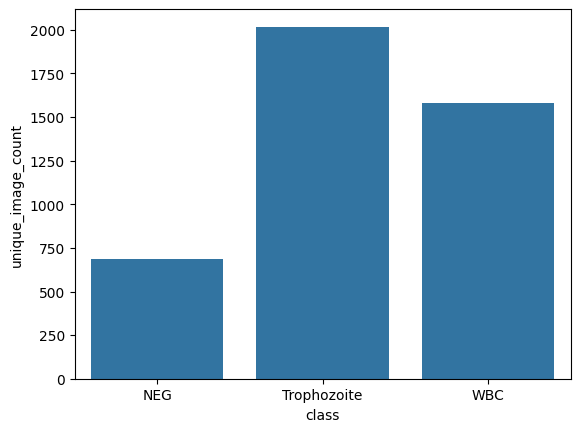

In [34]:
sns.barplot(train.groupby('class')['Image_ID'].nunique().reset_index().rename(columns={'Image_ID':'unique_image_count'}),
              x='class',y='unique_image_count');

In [35]:
train.groupby('class')['Image_ID'].nunique().reset_index().rename(columns={'Image_ID':'unique_image_count'})

,class,unique_image_count
0,NEG,688
1,Trophozoite,2018
2,WBC,1583


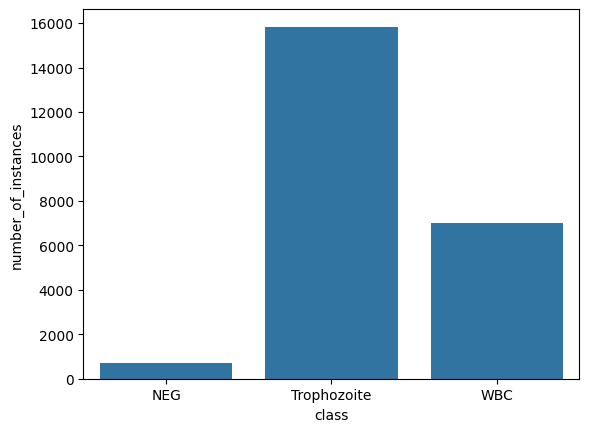

In [36]:
sns.barplot(train.groupby('class')['Image_ID'].agg({'count'}).reset_index().rename(columns={'count':'number_of_instances'}),
              x='class',y='number_of_instances');

In [37]:
train.groupby('class')['Image_ID'].agg({'count'}).reset_index().rename(columns={'count':'number_of_instances'})

,class,number_of_instances
0,NEG,688
1,Trophozoite,15838
2,WBC,7004


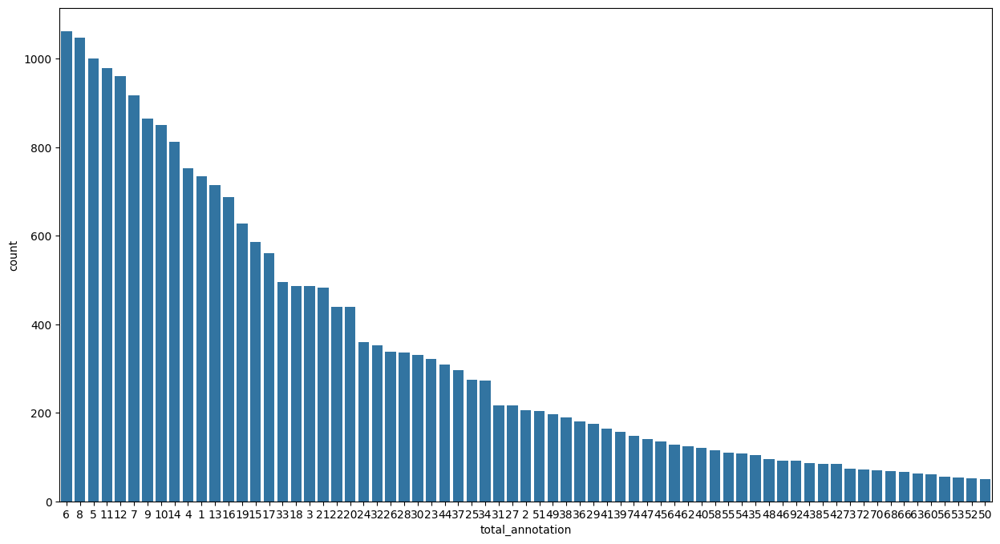

In [38]:
train['total_annotation']=train.groupby('Image_ID')['Image_ID'].transform('count')
_=plt.figure(figsize=(15,8))

sns.countplot(x=train['total_annotation'], order=train['total_annotation'].value_counts().index);

In [39]:
train['total_annotation'].describe()

count    23530.000000
mean        20.722227
std         17.197164
min          1.000000
25%          8.000000
50%         15.000000
75%         29.000000
max         92.000000
Name: total_annotation, dtype: float64

In [40]:
train[train['Image_ID']=='id_u3q6jdck4j.jpg'] 

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation
0,id_u3q6jdck4j.jpg,Trophozoite,1.0,712,1241,737,1270,4
10824,id_u3q6jdck4j.jpg,Trophozoite,1.0,652,1405,691,1442,4
13595,id_u3q6jdck4j.jpg,Trophozoite,1.0,458,1462,487,1491,4
18536,id_u3q6jdck4j.jpg,WBC,1.0,129,789,190,855,4


Current directory: d:\Lab\Research and Conference\Overleaf file_Malaria
Files in current directory:
  - Malaria Parasite Methodology Architecture.png
Found image at: .\Dataset\images\id_0051lznyrt.jpg


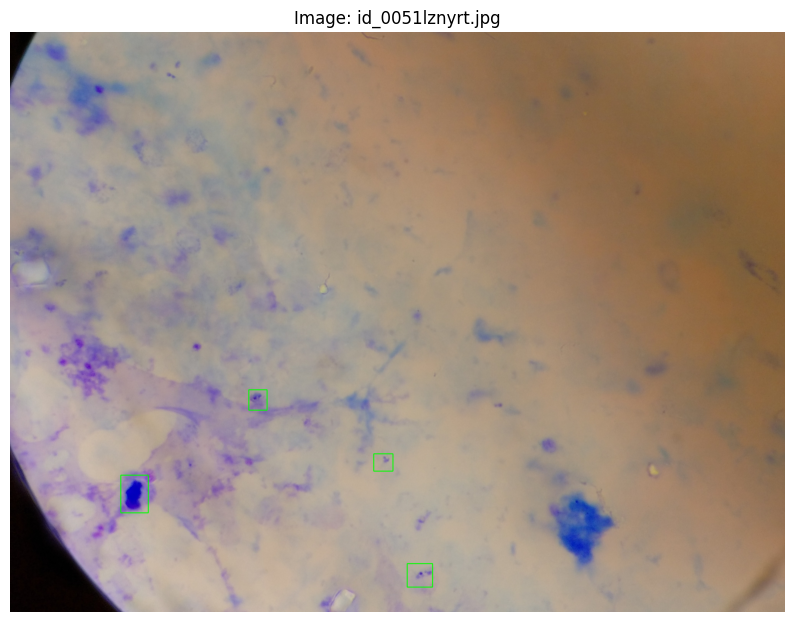

In [41]:
# First, let's check what files are available and set the correct path
# Assuming your images are in a directory, let's find the correct path

# Option 1: If images are in current directory
current_dir = os.getcwd()
print(f"Current directory: {current_dir}")

# Option 2: List files to see what's available
print("Files in current directory:")
for file in os.listdir('.'):
    if file.endswith('.jpg') or file.endswith('.png'):
        print(f"  - {file}")

# Option 3: Search for the specific file
def find_image_file(filename):
    for root, dirs, files in os.walk('.'):
        if filename in files:
            return os.path.join(root, filename)
    return None

# Find the image file
image_path = find_image_file('id_0051lznyrt.jpg')

if image_path:
    print(f"Found image at: {image_path}")
    
    # Now process the image
    fig = plt.figure(figsize=(10,10))

    # Read the image using the correct path
    imgs = cv2.imread(image_path)

    if imgs is None:
        print(f"Error: Could not load image from {image_path}")
    else:
        # Convert color space
        imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
        
        # Get bounding boxes for this image (make sure 'train' DataFrame is defined)
        # If you don't have the train DataFrame, we'll create a dummy one for demonstration
        if 'train' not in locals() and 'train' not in globals():
            print("Warning: 'train' DataFrame not found. Using dummy coordinates.")
            # Create dummy coordinates for demonstration
            import pandas as pd
            dummy_data = {
                'Image_ID': ['id_0051lznyrt.jpg'],
                'xmin': [100], 'ymin': [100], 
                'xmax': [300], 'ymax': [300]
            }
            train = pd.DataFrame(dummy_data)
        
        bbox_df = train[train['Image_ID'] == 'id_0051lznyrt.jpg'] 
        
        # Draw rectangles for each bounding box
        for index, row in bbox_df.iterrows():
            bbox_coords = row[['xmin', 'ymin', 'xmax', 'ymax']].tolist()
            
            # Convert coordinates to integers
            bbox_coords = [int(coord) for coord in bbox_coords]
            
            # Draw rectangle on the image
            imgs = cv2.rectangle(
                imgs, 
                (bbox_coords[0], bbox_coords[1]),
                (bbox_coords[2], bbox_coords[3]),
                (0, 255, 0),
                3
            )
        
        # Display the image
        plt.axis('off')        
        plt.imshow(imgs)
        plt.title(f"Image: {os.path.basename(image_path)}")
        plt.show()
else:
    print("Image file 'id_0051lznyrt.jpg' not found in current directory or subdirectories")
    print("Please make sure:")
    print("1. The image file exists")
    print("2. The file name is correct (case-sensitive)")
    print("3. The file is in the current working directory or a subdirectory")

In [42]:
train.groupby(['Image_ID','class'])['class'].agg({'count'}).reset_index().groupby(['Image_ID','class'])['class'].agg({'count'}).reset_index()

,Image_ID,class,count
0,id_0051lznyrt.jpg,Trophozoite,1
1,id_0051lznyrt.jpg,WBC,1
2,id_00m1onu6hj.jpg,NEG,1
3,id_00n92f65ke.jpg,NEG,1
4,id_00sirs797x.jpg,Trophozoite,1
...,...,...,...
4284,id_zyki7chovv.jpg,NEG,1
4285,id_zytohx1ml2.jpg,Trophozoite,1
4286,id_zz4ga0557e.jpg,Trophozoite,1
4287,id_zz4ga0557e.jpg,WBC,1


In [43]:
def img_read(train_image_path, im, new_size=None):

    img = cv2.imread(f"{"D:\Lab\Research and Conference\Overleaf file_Malaria\Dataset\images"}/{im}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if new_size:

        img=cv2.resize(img,(new_size,new_size))

        return img

    else:

        return img


def bbbox_annotate(img,bbox_df,bbox_line_size,new_size=False):

    if new_size:

        y_ = img.shape[0]

        x_ = img.shape[1]

        x_scale = new_size / x_

        y_scale = new_size / y_

        img=cv2.resize(img,(new_size,new_size))

        for index, row in bbox_df.iterrows():

            bbbox_res=row[['xmin','ymin','xmax','ymax']].tolist()

            if row['class']=='Trophozoite':

                bbox_clr=(255,0,0)

            elif row['class']=='WBC':

                bbox_clr=(255,255,0)
                
            elif row['class']=='NEG':

                bbox_clr=(0,255,0)

                

            imgs=(cv2.rectangle(img,(int(np.round(bbbox_res[0]*x_scale)),int(np.round(bbbox_res[1]*y_scale))),

                                          (int(np.round(bbbox_res[2]*x_scale)),int(np.round(bbbox_res[3]*y_scale))),

                                bbox_clr,bbox_line_size))

        return imgs

    else:

        for index, row in bbox_df.iterrows():

            bbbox_res=row[['xmin','ymin','xmax','ymax']].tolist()

            if row['class']=='Trophozoite':

                bbox_clr=(255,0,0)

            elif row['class']=='WBC':

                bbox_clr=(255,255,0)
                
            elif row['class']=='NEG':

                bbox_clr=(0,255,0)

      

            imgs=(cv2.rectangle(img,(bbbox_res[0],bbbox_res[1]),

                                          (bbbox_res[2],bbbox_res[3]),bbox_clr,bbox_line_size))

        return imgs
        
def auto_figsize(nrows, ncols, base_width=6, base_height=6):

    width = base_width * ncols

    height = base_height * nrows

    return (width, height)

def show_image_with_annotation(df,image_list,n_row=None,n_col=None,bbox_line_size=None):

    if bbox_line_size is None:

        bbox_line_size=1

    if n_row is None or n_col is None:

        n_row = math.ceil(math.sqrt(len(set(image_list))))

        n_col = math.ceil(len(set(image_list)) / n_row)

    fig=plt.subplots(figsize=auto_figsize(n_row,n_col))

    for i,im in enumerate(set(image_list)):

        img=img_read(train_image_path,im)

        h,w=img.shape[0],img.shape[1]

        _=plt.subplot(n_row,n_col,i+1,)

        plt.imshow(bbbox_annotate(img,df[df['Image_ID']==im].loc[:,['class','xmin','ymin','xmax','ymax']],

                                 new_size=512,bbox_line_size=bbox_line_size))#,aspect='auto')



        for target in df[df['Image_ID']==im]['class'].unique():



            if target == 'Trophozoite':

                plt.text(20, 20, 'Trophozoite', bbox={'facecolor': 'red', 'pad': 3,},ha='left',va='top')

               

            elif target == 'WBC':

                plt.text(20, 40, 'WBC', bbox={'facecolor': 'yellow', 'pad': 3,},color='red',ha='left',va='top')
                
            elif target == 'NEG':
                
                plt.text(20, 60, 'NEG', bbox={'facecolor': 'lime', 'pad': 3,},color='white',ha='left',va='top')

        plt.title(f"Image Name: {im}")

        plt.axis('off')

    plt.tight_layout()

    plt.show()

In [44]:
train.groupby(['Image_ID','class'])['class'].agg({'count'}).reset_index().groupby(['Image_ID','class'])['class'].agg({'count'}).reset_index()

,Image_ID,class,count
0,id_0051lznyrt.jpg,Trophozoite,1
1,id_0051lznyrt.jpg,WBC,1
2,id_00m1onu6hj.jpg,NEG,1
3,id_00n92f65ke.jpg,NEG,1
4,id_00sirs797x.jpg,Trophozoite,1
...,...,...,...
4284,id_zyki7chovv.jpg,NEG,1
4285,id_zytohx1ml2.jpg,Trophozoite,1
4286,id_zz4ga0557e.jpg,Trophozoite,1
4287,id_zz4ga0557e.jpg,WBC,1


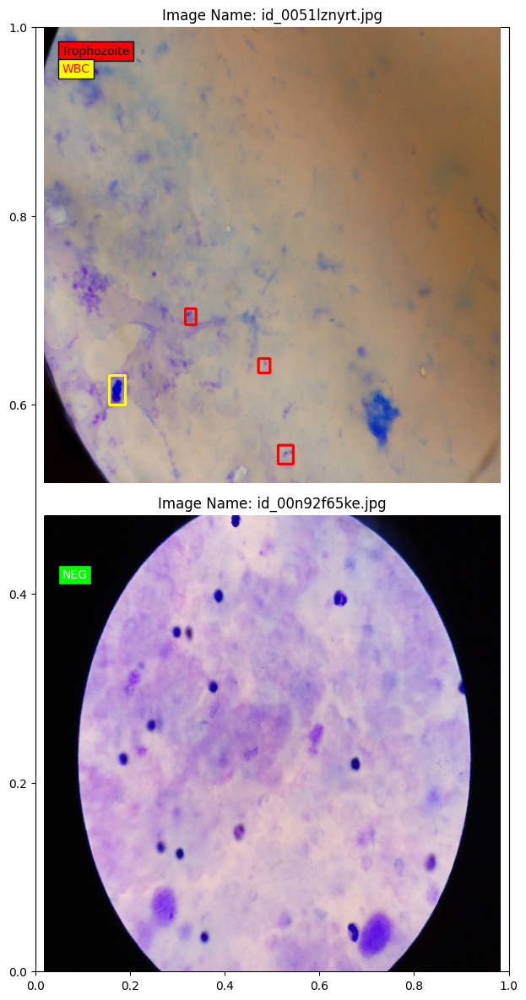

In [45]:
show_image_with_annotation(train,['id_0051lznyrt.jpg','id_00n92f65ke.jpg'],n_row=2,n_col=1,bbox_line_size=2)

In [46]:
train['bbox_center_x'] = (train['xmin'] + train['xmax']) / 2

train['bbox_center_y'] = (train['ymin'] + train['ymax']) / 2

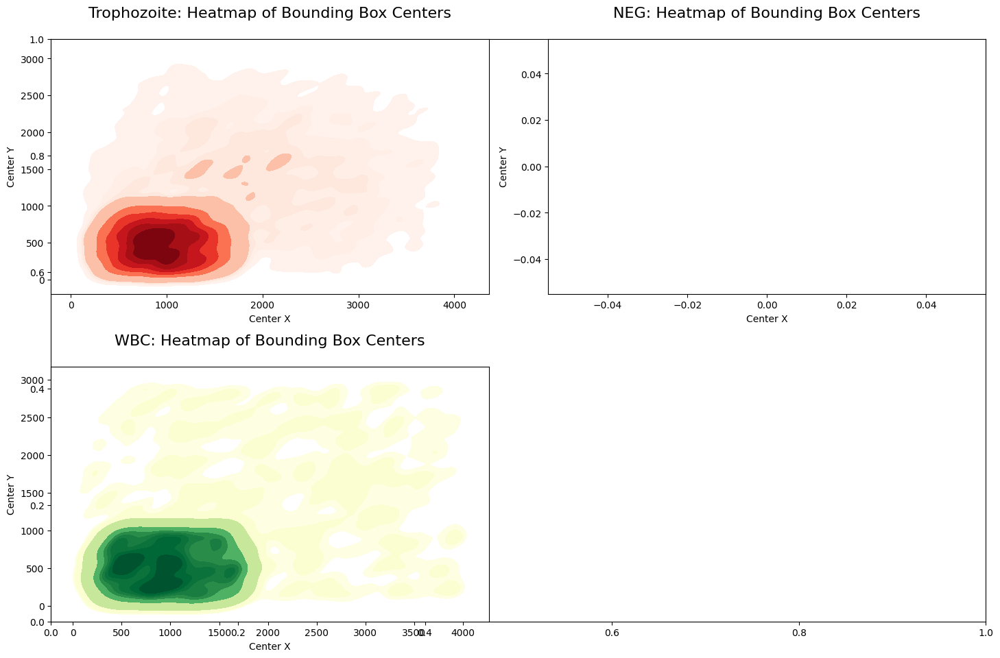

In [47]:
fig=plt.subplots(figsize=(15, 10))

for i,(label,clr)  in enumerate(zip(train['class'].unique(),["Reds", "Greens", "YlGn"])):    

    _=plt.subplot(2,2,i+1,)

    sns.kdeplot(data=train[train['class']==label],x='bbox_center_x', y='bbox_center_y', cmap=clr, shade=True, bw_adjust=.5)

    _=plt.title(f"{label}: Heatmap of Bounding Box Centers\n",fontsize=16)

    _=plt.xlabel("Center X")

    _=plt.ylabel("Center Y")

    _=plt.tight_layout()

plt.show()

In [48]:
def calculate_bbox_w_h(xmin, ymin, xmax, ymax):

    width = xmax - xmin

    height = ymax - ymin

    

    return [width,height]
train[['bbox_width','bbox_height']]=pd.DataFrame(train.apply(lambda x: calculate_bbox_w_h(x.xmin, x.ymin, x.xmax, x.ymax),axis=1).to_list(),index=train.index)
train['AspectRatio'] = round(train['bbox_width'] / train['bbox_height'],1)
train['AspectRatio'].describe()

count    22842.0
mean         inf
std          NaN
min          0.3
25%          0.9
50%          1.0
75%          1.1
max          inf
Name: AspectRatio, dtype: float64

In [49]:
train[(train == np.inf).any(axis=1)]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio
12017,id_wd51nh9072.jpg,Trophozoite,1.0,690,520,690,579,68,549.5,690.0,59,0,inf


In [50]:
train[~(train == np.inf).any(axis=1)]['AspectRatio'].describe()

count    22841.000000
mean         1.001475
std          0.180595
min          0.300000
25%          0.900000
50%          1.000000
75%          1.100000
max          2.300000
Name: AspectRatio, dtype: float64

In [51]:
train[train['AspectRatio'] == 0.3]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio
13175,id_gh76ohnnje.jpg,Trophozoite,1.0,297,732,310,736,19,734.0,303.5,4,13,0.3


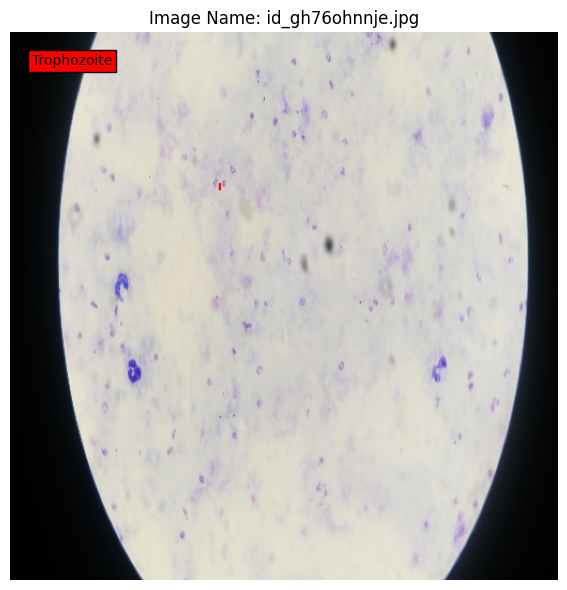

In [52]:
show_image_with_annotation(train[train['AspectRatio'] == 0.3],train[train['AspectRatio'] == 0.3]['Image_ID'],n_row=1,n_col=1)

In [53]:
train[train['bbox_height'] == 0]['Image_ID'].nunique()

689

In [54]:
train[train['bbox_height'] == 0]['class'].value_counts()

class
NEG            688
Trophozoite      1
Name: count, dtype: int64

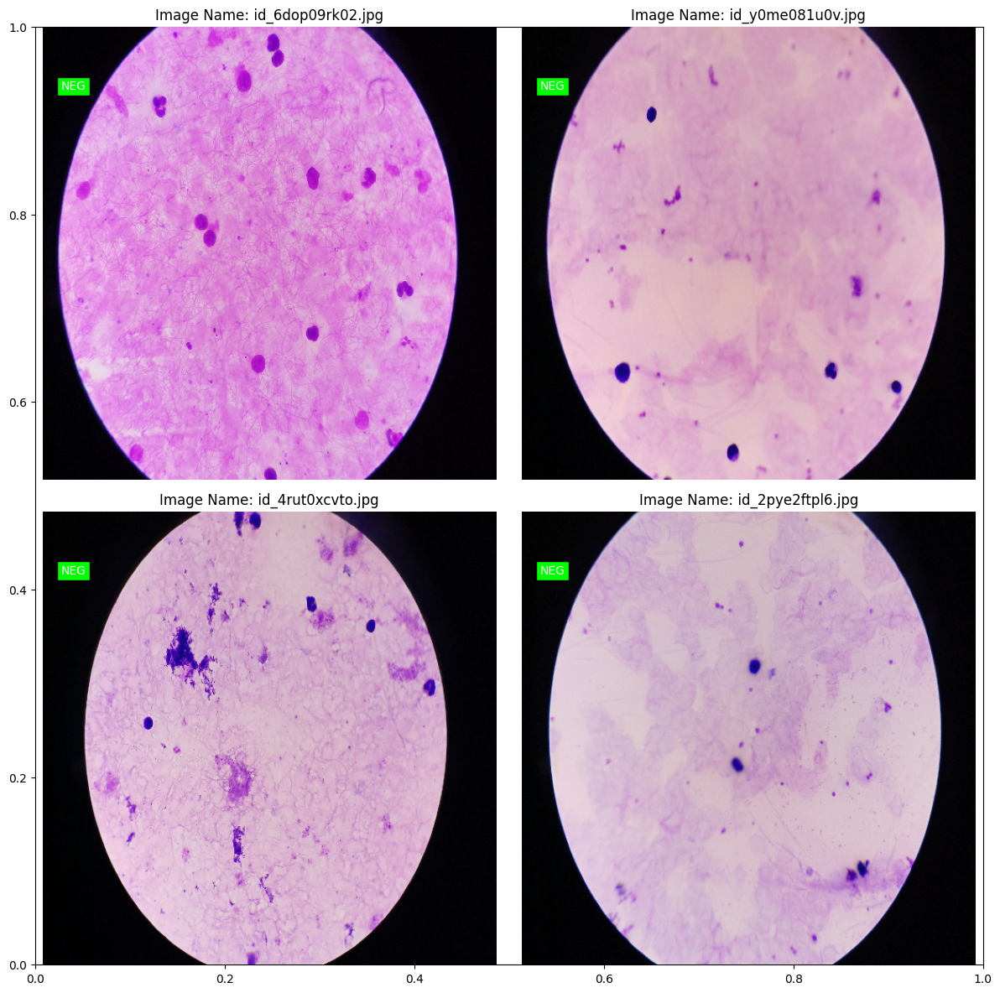

In [55]:
show_image_with_annotation(train,train[train['bbox_height'] == 0]['Image_ID'][:4],n_row=2,n_col=2)

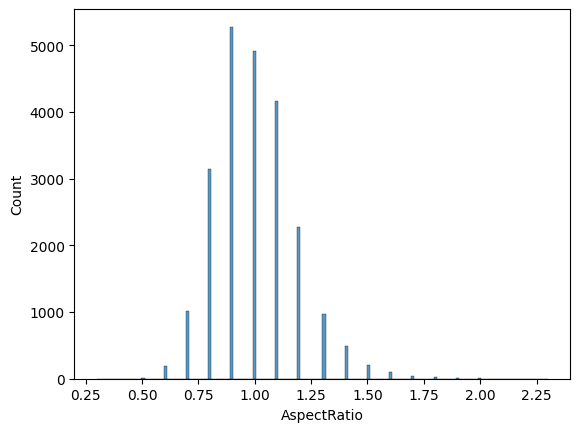

In [56]:
sns.histplot(data=train,x='AspectRatio');

In [57]:
train[train['bbox_height'] != 0]['AspectRatio'].describe()

count    22841.000000
mean         1.001475
std          0.180595
min          0.300000
25%          0.900000
50%          1.000000
75%          1.100000
max          2.300000
Name: AspectRatio, dtype: float64

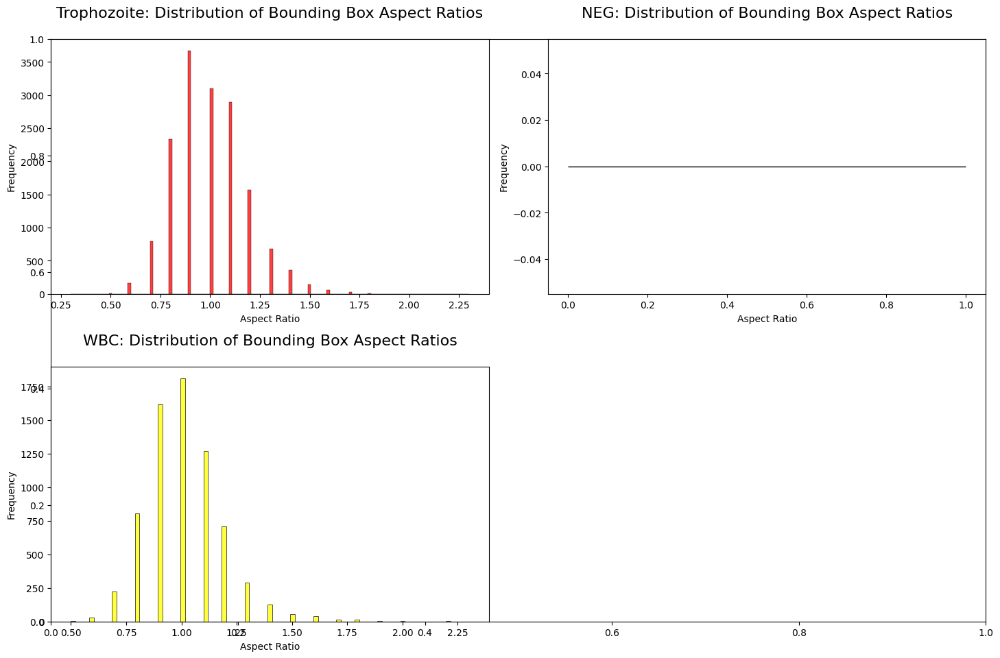

In [58]:
fig=plt.subplots(figsize=(15, 10))

for i,(label,clr)  in enumerate(zip(train['class'].unique(),["red","lime","yellow"])):    

    _=plt.subplot(2,2,i+1,)

    sns.histplot(data=train[train['bbox_height'] != 0][(train['class']==label)],x='AspectRatio',color=clr)

    _=plt.title(f"{label}: Distribution of Bounding Box Aspect Ratios\n",fontsize=16)

    _=plt.xlabel("Aspect Ratio")

    _=plt.ylabel("Frequency")

    _=plt.tight_layout()

plt.show()

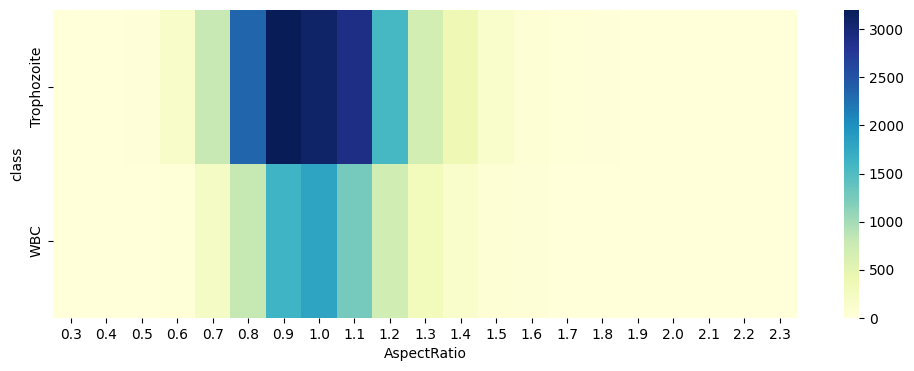

In [59]:
_=plt.figure(figsize=(12,4))

sns.heatmap(train[train['bbox_height'] != 0].groupby(['class','AspectRatio'])['class'].agg({'count'}).reset_index().pivot(index='class', columns='AspectRatio', values='count').fillna(0),

            robust=True,fmt='g',

           cmap="YlGnBu",

            annot_kws={"size": 15,

                      "weight": "bold"});

In [60]:
train[train['bbox_height'] != 0].groupby('class')['AspectRatio'].describe()

,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
Trophozoite,15837.0,0.996735,0.182794,0.3,0.9,1.0,1.1,2.3
WBC,7004.0,1.012193,0.175062,0.5,0.9,1.0,1.1,2.3


In [61]:
train[train['bbox_height'] != 0][np.isfinite(train['AspectRatio']) & (train['AspectRatio'] > 2)]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio
350,id_rnp8fcintk.jpg,WBC,1.0,16,1707,111,1918,20,1812.5,63.5,211,95,2.2
501,id_s15z5p4sev.jpg,WBC,1.0,263,772,363,982,7,877.0,313.0,210,100,2.1
2416,id_oepc5o47ei.jpg,Trophozoite,1.0,2230,984,2312,1170,5,1077.0,2271.0,186,82,2.3
9583,id_lw70dpk0sh.jpg,Trophozoite,1.0,809,2283,878,2431,5,2357.0,843.5,148,69,2.1
16096,id_dl2kaag27a.jpg,WBC,1.0,320,265,358,350,25,307.5,339.0,85,38,2.2
17812,id_yzhkb0zf37.jpg,Trophozoite,1.0,53,719,87,791,53,755.0,70.0,72,34,2.1
20015,id_1760ihasgs.jpg,WBC,1.0,6,942,44,1029,11,985.5,25.0,87,38,2.3


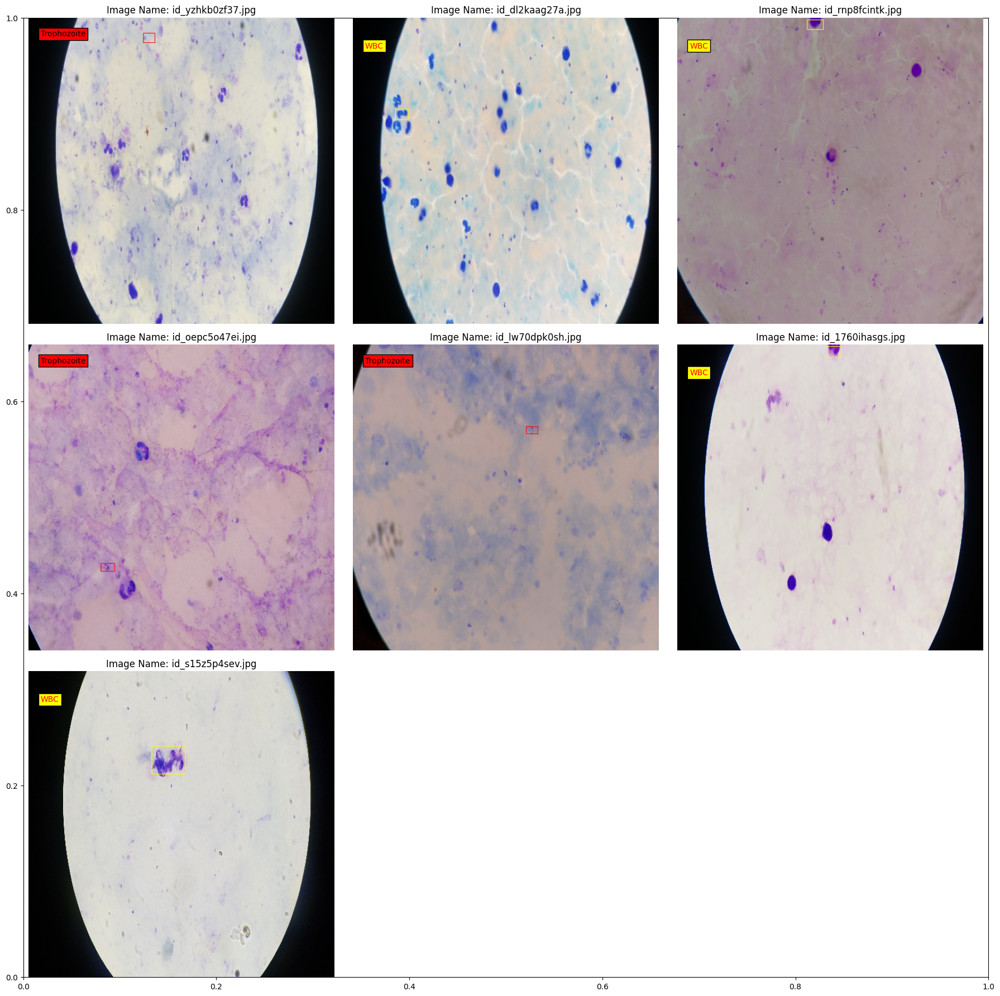

In [62]:
import math
show_image_with_annotation(train[np.isfinite(train['AspectRatio']) & (train['AspectRatio'] > 2)],

                           train[np.isfinite(train['AspectRatio']) & (train['AspectRatio'] > 2)]['Image_ID'].values)

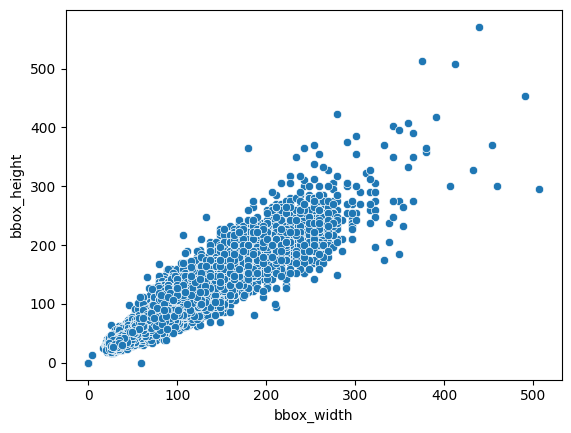

In [63]:
sns.scatterplot(data=train,x='bbox_width',y='bbox_height');

In [64]:
train[['bbox_width','bbox_height']].describe()

,bbox_width,bbox_height
count,23530.000000,23530.000000
mean,74.462558,75.460221
std,52.148619,52.205488
min,0.000000,0.000000
25%,36.000000,36.000000
50%,62.000000,62.000000
75%,98.000000,100.000000
max,507.000000,571.000000


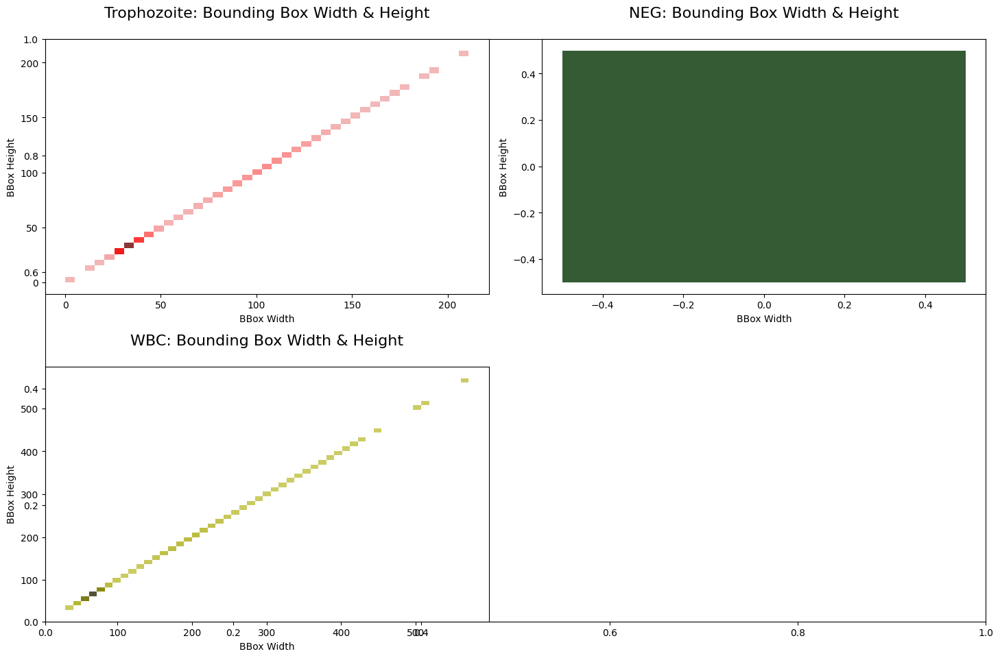

In [65]:
fig=plt.subplots(figsize=(15, 10))

for i,(label,clr)  in enumerate(zip(train['class'].unique(),["red","lime","yellow"])):    

    _=plt.subplot(2,2,i+1,)

    sns.histplot(data=train[train['class']==label],x='bbox_height',y='bbox_height',color=clr)

    _=plt.title(f"{label}: Bounding Box Width & Height\n",fontsize=16)

    _=plt.xlabel("BBox Width")

    _=plt.ylabel("BBox Height")

    _=plt.tight_layout()

In [66]:
train.groupby('class')[['bbox_width','bbox_height']].describe()

bbox_width                                                         \
                 count        mean        std   min   25%   50%    75%    max   
class                                                                           
NEG              688.0    0.000000   0.000000   0.0   0.0   0.0    0.0    0.0   
Trophozoite    15838.0   63.550638  35.980049   4.0  34.0  42.0   96.0  186.0   
WBC             7004.0  106.451885  66.120676  32.0  62.0  72.0  164.0  507.0   

            bbox_height                                                         
                  count        mean        std   min   25%   50%    75%    max  
class                                                                           
NEG               688.0    0.000000   0.000000   0.0   0.0   0.0    0.0    0.0  
Trophozoite     15838.0   65.080755  37.242075   0.0  34.0  42.0  100.0  211.0  
WBC              7004.0  106.343518  65.294707  30.0  62.0  72.0  164.0  571.0

In [67]:
from tqdm import tqdm
from itertools import combinations

def iou(box1, box2):
    """Calculate the Intersection over Union (IoU) of two bounding boxes."""
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2
    
    x_left = max(x1_min, x2_min)
    y_top = max(y1_min, y2_min)
    x_right = min(x1_max, x2_max)
    y_bottom = min(y1_max, y2_max)
    
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)
    
    iou_value = intersection_area / float(box1_area + box2_area - intersection_area)
    return iou_value

def get_iou_pairs_single_threaded(df, imagecol):
    image_ids = df[imagecol].unique()
    all_overlapping_pairs = []
    
    for image_id in tqdm(image_ids, desc="Processing IoU Pairs"):
        filtered_df = df[df[imagecol] == image_id]
        box_indices = filtered_df.index.values
        
        for i, j in combinations(box_indices, 2):
            box1 = filtered_df.loc[i, ['xmin', 'ymin', 'xmax', 'ymax']].tolist()
            box2 = filtered_df.loc[j, ['xmin', 'ymin', 'xmax', 'ymax']].tolist()
            iou_value = iou(box1, box2)
            all_overlapping_pairs.append((i, j, iou_value))
    
    return all_overlapping_pairs

# Use the single-threaded version if multiprocessing fails
overlapping_pairs = get_iou_pairs_single_threaded(train, 'Image_ID')

Processing IoU Pairs: 100%|██████████| 2747/2747 [02:43<00:00, 16.79it/s] 


In [68]:
def add_iou_to_row(df, pair_value):

    iou_dict = {}

    for index1, index2, value in tqdm(pair_value,desc='Adding IoU Values to the Dataframe'):

        iou_dict[index1] = value

        iou_dict[index2] = value


    df['IoU'] = df.index.map(iou_dict)

    return df   

train=add_iou_to_row(train, overlapping_pairs)

Adding IoU Values to the Dataframe: 100%|██████████| 232032/232032 [00:00<00:00, 1654825.40it/s]


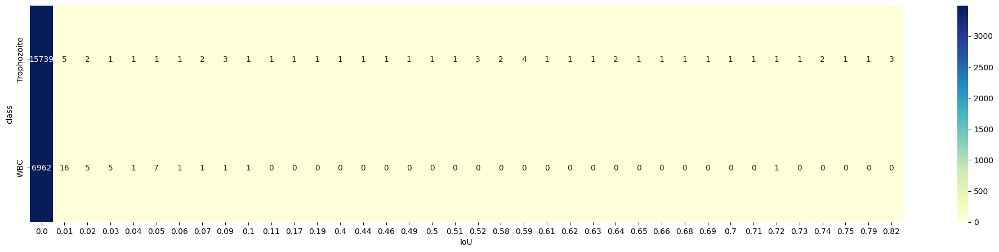

In [69]:
train['IoU']=round(train['IoU'],2)
target_iou_count=train.groupby(['class','IoU'])['Image_ID'].agg({'count'}).reset_index().pivot(index='class', columns='IoU', values='count').fillna(0)
_=plt.figure(figsize=(25,5))

sns.heatmap(target_iou_count,robust=True,fmt='g',

           cmap="YlGnBu",annot=True);

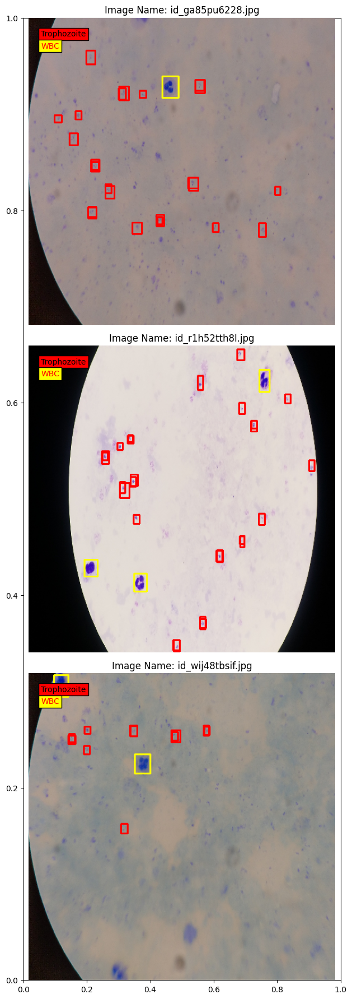

In [70]:
show_image_with_annotation( train,

                           train[train['IoU']>0.8]['Image_ID'],

                           bbox_line_size=2,n_col=1,n_row=3)

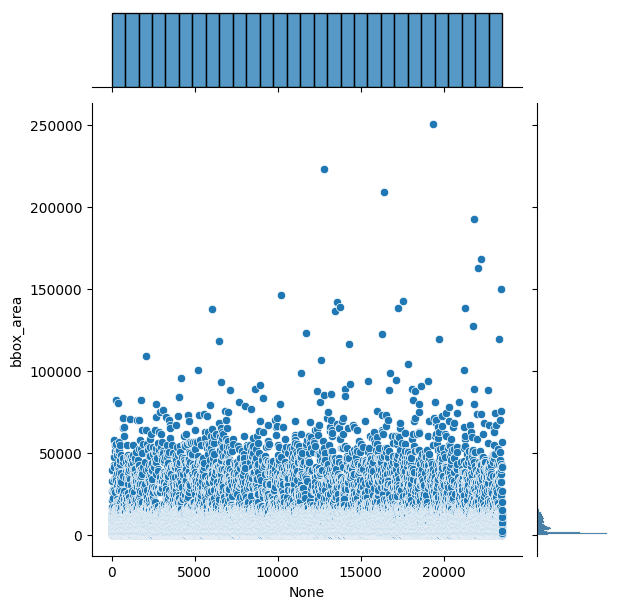

In [71]:
train['bbox_area']=train.apply(lambda df:((df['xmax']-df['xmin'])*(df['ymax']-df['ymin'])), axis=1)
sns.jointplot(train['bbox_area']);

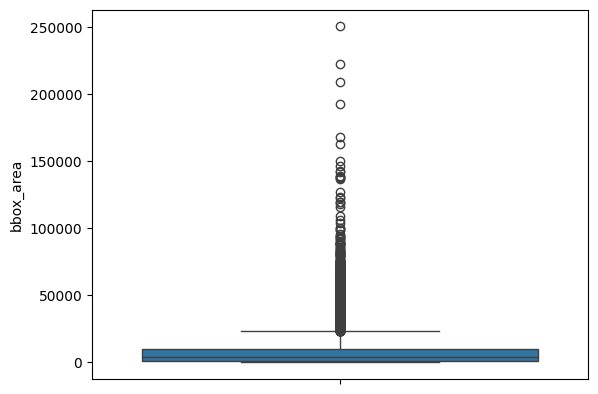

In [72]:
sns.boxplot(y=train['bbox_area']);

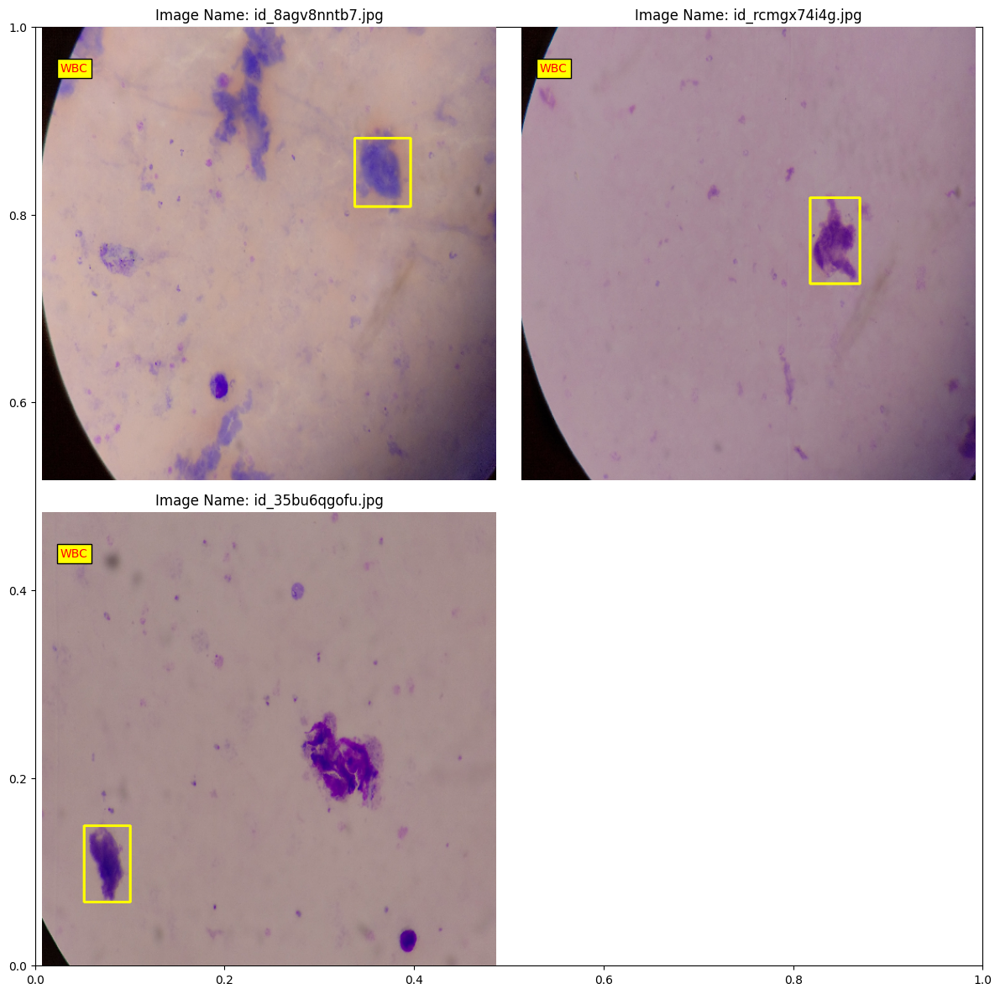

In [73]:
show_image_with_annotation(train[train['bbox_area']>200000],

                           train[train['bbox_area']>200000]['Image_ID'].unique(),

                           bbox_line_size=2)

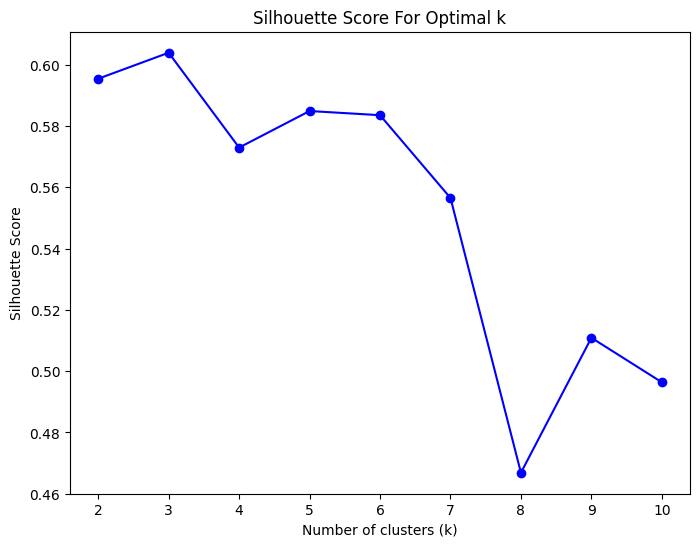

In [74]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

data = train[['bbox_width', 'bbox_height']].values


silhouette_scores = []

for k in range(2, 11): 
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(data)
    score = silhouette_score(data, labels)
    silhouette_scores.append(score)

plt.figure(figsize=(8, 6))
plt.plot(range(2, 11), silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal k')
plt.show()

In [75]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(data)

cluster_centers = kmeans.cluster_centers_

anchor_sizes = cluster_centers.tolist()

print("Anchor Sizes (width, height):", anchor_sizes)

print("\n\nAspect Ratio:",cluster_centers[:, 0] / cluster_centers[:, 1])

Anchor Sizes (width, height): [[202.13757396449645, 200.94526627218767], [39.202123537164155, 39.56211733705399], [97.2606116990342, 99.73159669728909]]


Aspect Ratio: [1.00593349 0.99090054 0.97522365]


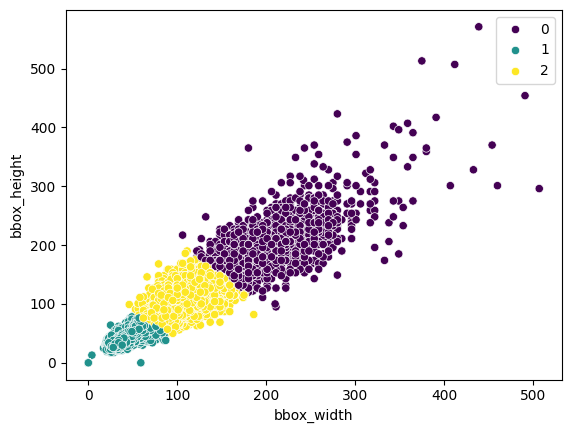

In [76]:
palette = sns.color_palette("viridis", as_cmap=True)

sns.scatterplot(train,x='bbox_width', y='bbox_height',hue=kmeans.labels_, palette = palette );

In [77]:
def count_colors(df):

    n=[]

    for im in tqdm(df['Image_ID'].unique()):

        ims=Image.open(f"{"D:\Lab\Research and Conference\Overleaf file_Malaria\Dataset\images"}/{im}")


        n.append(len(ims.getcolors(ims.size[0]*ims.size[1])))

    return n

In [78]:
train_df_image_unique_colors=count_colors(train)
train = pd.merge(train,pd.DataFrame({'Image_ID':train['Image_ID'].unique(),'no_of_colors':train_df_image_unique_colors}),how='left',on='Image_ID')

100%|██████████| 2747/2747 [08:05<00:00,  5.65it/s]


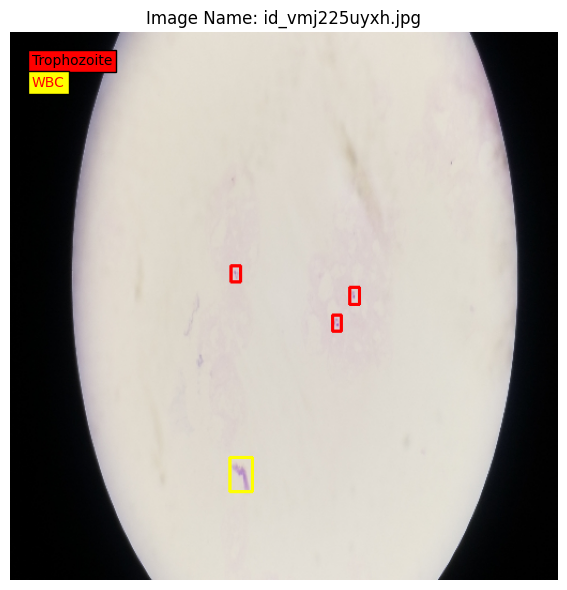

In [79]:
show_image_with_annotation(train,

                           train[train['no_of_colors']<11500]['Image_ID'].values,

                           bbox_line_size=2)

In [80]:
test_df_image_unique_colors=count_colors(test)



test=pd.merge(test,pd.DataFrame({'Image_ID':test['Image_ID'].unique(),'no_of_colors':test_df_image_unique_colors}),how='left',on='Image_ID')

100%|██████████| 1178/1178 [03:30<00:00,  5.59it/s]


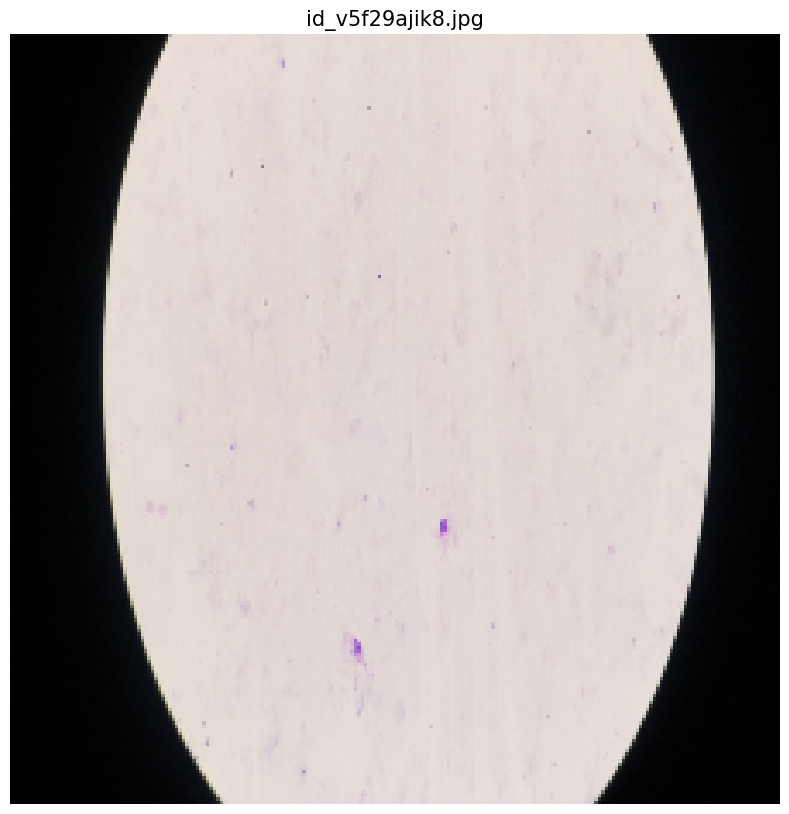

In [81]:
# Ensure 'no_of_colors' column exists in test DataFrame
if 'no_of_colors' not in test.columns:
    test = pd.merge(
        test,
        pd.DataFrame({'Image_ID': test['Image_ID'].unique(), 'no_of_colors': test_df_image_unique_colors}),
        how='left',
        on='Image_ID'
    )

fig = plt.figure(figsize=(15, 10))

for i, img in enumerate(test[test['no_of_colors'] < 11000]['Image_ID'].unique()):
    ax = plt.subplot(1, 1, i + 1)
    ax.imshow(img_read(train_image_path, img, new_size=224))
    ax.set_title(f"{img}", fontsize=15)
    ax.axis("off")

plt.show()

In [82]:
import os, torch, random, shutil, numpy as np, pandas as pd
from glob import glob; from PIL import Image
from torch.utils.data import random_split, Dataset, DataLoader
from torchvision import transforms as T
torch.manual_seed(2024)
class CustomDataset(Dataset):
    
    def __init__(self, root, data_type = "Train", transformations = None):
        self.transformations, self.data_type, self.root   = transformations, data_type, root
        self.cls_names, self.cls_counts, count            = {}, {}, 0

        df            = pd.read_csv(f"{root}/{data_type}.csv")
        if data_type == "Train": 
            self.im_paths = {fname: lbl for fname, lbl in zip(df["Image_ID"], df["class"])}
            
            for idx, (_, label) in enumerate(self.im_paths.items()):                             
                if label not in self.cls_names: self.cls_names[label] = count; count += 1
                if label not in self.cls_counts: self.cls_counts[label] = 1
                else: self.cls_counts[label] += 1

        else: self.im_paths = [self.get_full_path(fname) for fname in df["Image_ID"]]            
    
    def __len__(self): return len(self.im_paths)

    def get_full_path(self, fname): return f"{self.root}/images/{fname}"
    
    def get_im_gt(self, idx): return (list(self.im_paths.keys())[idx]), list(self.im_paths.values())[idx]

    def get_cls_name(self, path): return list(self.im_paths.values())[list(self.im_paths.keys()).index(path)]  
    
    def get_pos_neg_im_paths(self, qry_label, idx):
        
        pos_im_paths = [im_path for (im_path, lbl) in zip(list(self.im_paths.keys()), list(self.im_paths.values())) if qry_label == lbl]
        neg_im_paths = [im_path for (im_path, lbl) in zip(list(self.im_paths.keys()), list(self.im_paths.values())) if qry_label != lbl]

        assert (len(pos_im_paths) + len(neg_im_paths)) == len(self.im_paths)
                
        pos_rand_int = random.randint(a = 0, b = len(pos_im_paths) - 1)
        neg_rand_int = random.randint(a = 0, b = len(neg_im_paths) - 1)
        
        return pos_im_paths[pos_rand_int], neg_im_paths[neg_rand_int]
    
    def __len__(self): return len(self.im_paths)

    def __getitem__(self, idx):
        
        if self.data_type == "Train": 
            
            im_path, qry_label = self.get_im_gt(idx)
            qry_im = Image.open(self.get_full_path(im_path)).convert("RGB")
            
            pos_im_path, neg_im_path = self.get_pos_neg_im_paths(qry_label = qry_label, idx = idx)
            pos_im, neg_im = Image.open(self.get_full_path(pos_im_path)).convert("RGB"), Image.open(self.get_full_path(neg_im_path)).convert("RGB")
            
            neg_gt = self.cls_names[self.get_cls_name(neg_im_path)] # WBC
            qry_gt = self.cls_names[qry_label]

            if self.transformations: qry_im = self.transformations(qry_im); pos_im = self.transformations(pos_im); neg_im = self.transformations(neg_im)

            data = {}

            data["qry_im"] = qry_im
            data["qry_gt"] = qry_gt
            data["pos_im"] = pos_im
            data["neg_im"] = neg_im
            data["neg_gt"] = neg_gt
            
            return data       
            
        else: return self.transformations(Image.open(self.im_paths[idx]).convert("RGB"))
    
def get_dls(root, transformations, bs, split = [0.9, 0.1], ns = 4):
    
    ds    = CustomDataset(root = root, data_type = "Train", transformations = transformations)
    ts_ds = CustomDataset(root = root, data_type = "Test",  transformations = transformations)
    
    total_len = len(ds)
    tr_len = int(total_len * split[0]); vl_len = total_len - tr_len
    
    tr_ds, vl_ds = random_split(dataset = ds, lengths = [tr_len, vl_len])
    tr_dl, val_dl, ts_dl = DataLoader(tr_ds, batch_size = bs, shuffle = True, num_workers = ns), DataLoader(vl_ds, batch_size = bs, shuffle = False, num_workers = ns), DataLoader(ts_ds, batch_size = 1, shuffle = False, num_workers = ns)
    
    return tr_dl, val_dl, ts_dl, ds.cls_names, ds.cls_counts

root = "D:/Lab/Research and Conference/Overleaf file_Malaria/Dataset"
mean, std, size, bs = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225], 224, 32
tfs = T.Compose([T.ToTensor(), T.Resize(size = (size, size), antialias = False), T.Normalize(mean = mean, std = std)])
tr_dl, val_dl, ts_dl, classes, cls_counts = get_dls(root = root, transformations = tfs, bs = bs)

print(len(tr_dl)); print(len(val_dl)); print(len(ts_dl)); print(classes)

78
9
1178
{'WBC': 0, 'Trophozoite': 1, 'NEG': 2}


Data analysis is in process...



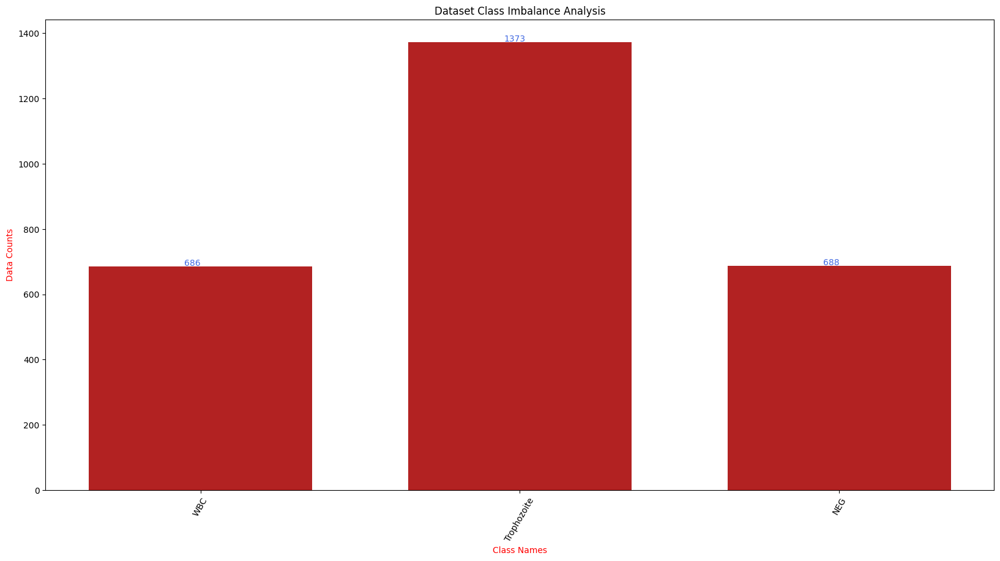

In [83]:
import numpy as np
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, vis_datas, n_ims, rows, cmap = None, cls_names = None, cls_counts = None, t_type = "rgb"):

        self.n_ims, self.rows = n_ims, rows
        self.t_type, self.cmap,  = t_type, cmap
        self.cls_names = cls_names
        
        data_types = ["train", "val", "test"]
        self.vis_datas = {f"{data_types[i]}": vis_datas[i] for i in range(len(vis_datas))}
            
        if isinstance(cls_counts, list): self.analysis_datas = {f"{data_types[i]}": cls_counts[i] for i in range(len(cls_counts))}
        else: self.analysis_datas = {"all": cls_counts}

    def tn2np(self, t):
        
        gray_tfs = T.Compose([T.Normalize(mean = [ 0.], std = [1/0.5]), T.Normalize(mean = [-0.5], std = [1])])
        rgb_tfs = T.Compose([T.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]), T.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ])])
        
        invTrans = gray_tfs if self.t_type == "gray" else rgb_tfs 
        
        return (invTrans(t) * 255).detach().squeeze().cpu().permute(1,2,0).numpy().astype(np.uint8) if self.t_type == "gray" else (invTrans(t) * 255).detach().cpu().permute(1,2,0).numpy().astype(np.uint8)

    def plot(self, rows, cols, count, im, title = "Original Image"):
    
        plt.subplot(rows, cols, count)
        plt.imshow(self.tn2np(im))
        plt.axis("off"); plt.title(title)
        
        return count + 1

    def vis(self, data, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1
        
        plt.figure(figsize = (25, 20))
                
        indices = [np.random.randint(low = 0, high = len(data) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):
        
            if count == self.n_ims + 1: break
            
            meta_data = data[index]
            qry_im, pos_im, neg_im, qry_lbl, neg_lbl = meta_data["qry_im"], meta_data["pos_im"], meta_data["neg_im"], meta_data["qry_gt"], meta_data["neg_gt"]

            count = self.plot(self.rows, cols, count, im = qry_im, title = f"Query Image \n Class -> {self.cls_names[qry_lbl]}")

            count = self.plot(self.rows, cols, count, im = pos_im, title = f"Positive Image \n Class -> {self.cls_names[qry_lbl]}")

            count = self.plot(self.rows, cols, count, im = neg_im, title = f"Negative Image \n Class -> {self.cls_names[neg_lbl]}")
        
        plt.show()

    def data_analysis(self, cls_counts, save_name):

        print("Data analysis is in process...\n")
        
        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(cls_counts.keys()); counts = list(cls_counts.values())
        
        _, ax = plt.subplots(figsize = (20, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = "firebrick")
        ax.set_xlabel("Class Names", color = "red")
        ax.set_xticklabels(cls_names, rotation = 60)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "red")
        ax.set_title(f"Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")
    
    def visualization(self): [self.vis(data.dataset, save_name) for (save_name, data) in self.vis_datas.items()]
        
    def analysis(self): [self.data_analysis(data, save_name) for (save_name, data) in self.analysis_datas.items()]
        
vis = Visualization(vis_datas = [tr_dl, val_dl], n_ims = 18, rows = 6, cmap = "rgb", cls_names = list(classes.keys()), cls_counts = cls_counts)
vis.analysis()

TRAIN Data Visualization is in process...



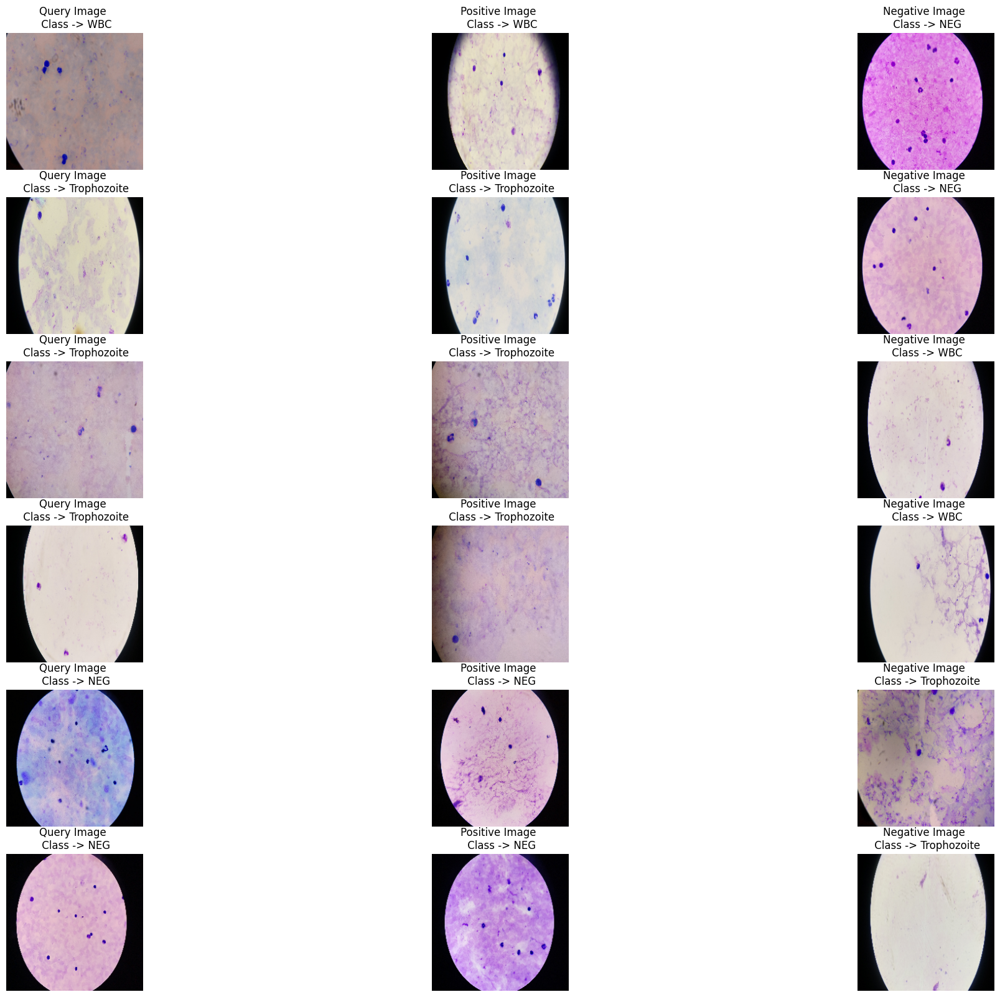

VAL Data Visualization is in process...



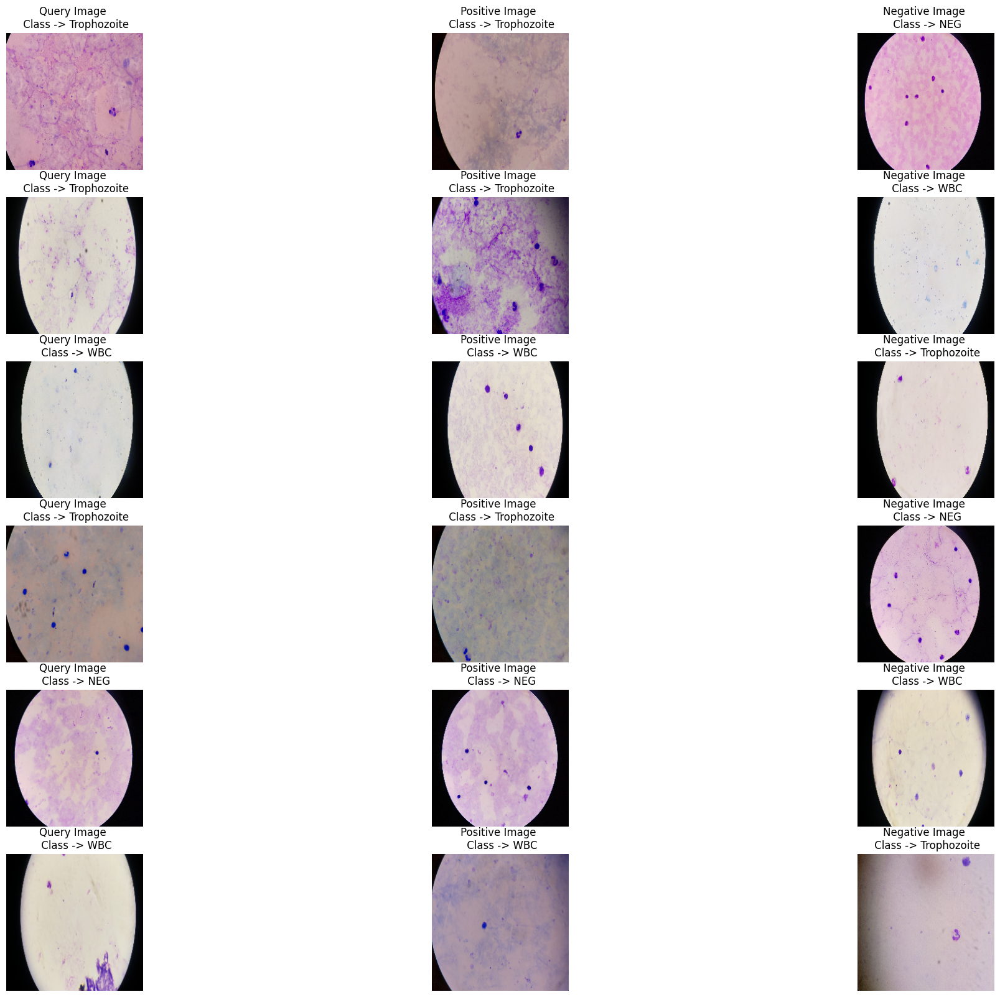

In [84]:
vis.visualization()

Rexnet_150

In [85]:
import os, torch, datetime
import torch; print(torch.cuda.is_available())
from torchmetrics.classification import MulticlassStatScores, MulticlassF1Score
from tqdm import tqdm
from time import time
import timm

class TrainValidation:

    def __init__(self, model_name, tr_dl, val_dl, classes, device, lr, save_dir, 
                 run_name, data_name, epochs, project_name, bs, patience = 5):

        self.model_name, self.classes, self.device      = model_name, classes, device
        self.data_name, self.lr, self.save_dir, self.bs = data_name, lr, save_dir, bs
        self.tr_dl, self.val_dl, self.patience          = tr_dl, val_dl, patience
        self.run_name, self.epochs, self.project_name   = run_name, epochs, project_name
        if len(self.tr_dl) == 0 or len(self.val_dl) == 0:
            raise ValueError("Dataloaders are empty. Check dataset path and contents.")
        self.run()
        
    def init_model(self): self.model = timm.create_model(self.model_name, pretrained = True, num_classes = len(self.classes))  
    
    def init_lists(self): self.tr_losses, self.val_losses, self.tr_sens, self.val_senss, self.tr_specs, self.val_specs, self.tr_accs, self.val_accs, self.tr_f1s, self.val_f1s, self.tr_times, self.vl_times = [], [], [], [], [], [], [], [], [], [], [], []

    def train_setup(self): 
                
        self.best_loss, self.threshold, self.not_improved = float(torch.inf), 0.01, 0
        self.stop_train, self.tr_len, self.val_len        = False, len(self.tr_dl), len(self.val_dl)
        self.cs_lbls = {"cos_pos": torch.tensor(1.).unsqueeze(0), "cos_neg": torch.tensor(-1.).unsqueeze(0)}
        self.ckpt_path = f"{self.save_dir}/{self.data_name}_{self.run_name}_{self.model_name}_best_model.pth"
        run_name = f"{self.run_name}_{self.model_name}_bs_{self.bs}"
        
        str_time = str(datetime.datetime.now()).split(".")[0]
        
        self.model.to(self.device).eval()
        self.ce_loss_fn   = torch.nn.CrossEntropyLoss() 
        self.cs_loss_fn   = torch.nn.CosineEmbeddingLoss(margin = 0.3) 
        self.optimizer   = torch.optim.Adam(params = self.model.parameters(), lr = self.lr)
        self.f1_score    = MulticlassF1Score(num_classes = len(self.classes), average = "micro").to(self.device) 
        self.stat_scores = MulticlassStatScores(num_classes = len(self.classes), average = "micro").to(self.device)
    
    def makedirs(self, path): os.makedirs(path, exist_ok = True)
    
    def get_fms(self, fms):

        pool = torch.nn.AdaptiveAvgPool2d((1, 1))
        
        return [torch.reshape(pool(fm), (-1, fm.shape[1])) for fm in fms]
    
    def get_logits(self, ims): return [self.model.forward_features(im) for im in ims]

    def get_preds(self, fts): return [self.model.forward_head(ft) for ft in fts]
    
    def get_cs_loss(self, qry_fms, pos_fms, neg_fms): return self.cs_loss_fn(qry_fms, pos_fms, self.cs_lbls["cos_pos"].to(self.device)) + self.cs_loss_fn(qry_fms, neg_fms, self.cs_lbls["cos_neg"].to(self.device))

    def get_ce_loss(self, qry_preds, pos_preds, qry_lbls): return self.ce_loss_fn(qry_preds, qry_lbls) + self.ce_loss_fn(pos_preds, qry_lbls)
    
    def get_preds_loss(self, qry_ims, pos_ims, neg_ims, qry_lbls): 
        
        qry_logits, pos_logits, neg_logits = self.get_logits([qry_ims, pos_ims, neg_ims])
        qry_preds, pos_preds = self.get_preds([qry_logits, pos_logits])
        
        qry_fms, pos_fms, neg_fms = self.get_fms([qry_logits, pos_logits, neg_logits])
        cs_loss = self.get_cs_loss(qry_fms, pos_fms, neg_fms)

        ce_loss = self.get_ce_loss(qry_preds, pos_preds, qry_lbls)

        loss = cs_loss + ce_loss
                
        return torch.argmax(qry_preds, dim = 1), loss

    def eval_train_batch(self, preds, gts, loss): 
        
        self.epoch_acc    += (preds == gts).sum().item()
        self.epoch_loss   += loss.item()
        self.epoch_f1     += self.f1_score(preds, gts)
        tp, fp, tn, fn, _  = self.stat_scores(preds, gts)
        self.spec         += tn / (tn + fp) if (tn + fp) > 0 else 0
        self.sens         += tp / (tp + fn) if (tp + fn) > 0 else 0

    def eval_valid_batch(self, preds, gts, loss): 

        self.val_epoch_loss   += loss.item()
        self.val_epoch_acc    += (preds == gts).sum().item()
        self.val_epoch_f1     +=  self.f1_score(preds, gts)
        tp, fp, tn, fn, _      = self.stat_scores(preds, gts)
        self.val_spec         += tn / (tn + fp) if (tn + fp) > 0 else 0
        self.val_sens         += tp / (tp + fn) if (tp + fn) > 0 else 0        
            
    def to_device(self, batch): return batch["qry_im"].to(self.device), batch["pos_im"].to(self.device), batch["neg_im"].to(self.device), batch["qry_gt"].to(self.device)
    
    def train_one_epoch(self, epoch):

        self.model.train()
        self.epoch_loss, self.epoch_acc, self.epoch_f1, self.loss, self.sens, self.spec = 0, 0, 0, 0, 0, 0

        tr_start = time(); 
        for idx, batch in tqdm(enumerate(self.tr_dl)):
            
            qry_ims, pos_ims, neg_ims, qry_im_lbls = self.to_device(batch)

            qry_preds, loss = self.get_preds_loss(qry_ims, pos_ims, neg_ims, qry_im_lbls)
            self.eval_train_batch(qry_preds, qry_im_lbls, loss)
            self.optimizer.zero_grad(); loss.backward(); self.optimizer.step()

        tr_time = time() - tr_start; self.tr_times.append(tr_time)
        tr_loss_to_track = self.epoch_loss / self.tr_len if self.tr_len > 0 else 0
        tr_sens_to_track = self.sens / self.tr_len if self.tr_len > 0 else 0
        tr_spec_to_track = self.spec / self.tr_len if self.tr_len > 0 else 0
        tr_acc_to_track  = self.epoch_acc  / len(self.tr_dl.dataset) if len(self.tr_dl.dataset) > 0 else 0
        tr_f1_to_track   = self.epoch_f1   / self.tr_len if self.tr_len > 0 else 0
        self.tr_losses.append(tr_loss_to_track); self.tr_accs.append(tr_acc_to_track); self.tr_f1s.append(tr_f1_to_track); self.tr_sens.append(tr_sens_to_track); self.tr_specs.append(tr_spec_to_track)
        
        print("\n~~~~~~~~~~~~~~~~~~~~ TRAIN PROCESS STATS ~~~~~~~~~~~~~~~~~~~~")
        print(f"\n{epoch + 1}-epoch train process is completed!\n")
        print(f"{epoch + 1}-epoch train loss          -> {tr_loss_to_track:.3f}")
        print(f"{epoch + 1}-epoch train spec          -> {tr_spec_to_track:.3f}")
        print(f"{epoch + 1}-epoch train sens          -> {tr_sens_to_track:.3f}")
        print(f"{epoch + 1}-epoch train accuracy      -> {tr_acc_to_track:.3f}")
        print(f"{epoch + 1}-epoch train f1-score      -> {tr_f1_to_track:.3f}")

    def eval_one_epoch(self, epoch):

        self.val_epoch_loss, self.val_epoch_acc, self.val_epoch_f1, self.val_sens, self.val_spec = 0, 0, 0, 0, 0
        self.model.eval()
        with torch.no_grad():
            vl_start = time()
            for idx, batch in enumerate(self.val_dl):
                
                qry_ims, pos_ims, neg_ims, qry_im_lbls = self.to_device(batch)

                qry_preds, loss = self.get_preds_loss(qry_ims, pos_ims, neg_ims, qry_im_lbls)
                self.eval_valid_batch(qry_preds, qry_im_lbls, loss)                           

            vl_time = time() - vl_start; self.vl_times.append(vl_time)
            val_loss_to_track = self.val_epoch_loss  / self.val_len if self.val_len > 0 else 0
            val_sens_to_track = self.val_sens / self.val_len if self.val_len > 0 else 0
            val_spec_to_track = self.val_spec / self.val_len if self.val_len > 0 else 0
            val_acc_to_track  = self.val_epoch_acc   / len(self.val_dl.dataset) if len(self.val_dl.dataset) > 0 else 0
            val_f1_to_track   = self.val_epoch_f1    / self.val_len if self.val_len > 0 else 0
            self.val_losses.append(val_loss_to_track); self.val_accs.append(val_acc_to_track); self.val_f1s.append(val_f1_to_track); self.val_senss.append(val_sens_to_track); self.val_specs.append(val_spec_to_track)
            
            print(f"\n{epoch + 1}-epoch validation process is completed!\n")
            print(f"{epoch + 1}-epoch validation loss     -> {val_loss_to_track:.3f}")
            print(f"{epoch + 1}-epoch validation spec     -> {val_spec_to_track:.3f}")
            print(f"{epoch + 1}-epoch validation sens     -> {val_sens_to_track:.3f}")
            print(f"{epoch + 1}-epoch validation accuracy -> {val_acc_to_track:.3f}")
            print(f"{epoch + 1}-epoch validation f1-score -> {val_f1_to_track:.3f}")

            print("\n~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

        return val_loss_to_track

    def save_best_model(self): torch.save(self.model.state_dict(), self.ckpt_path); print("Pretrained weights of the model with lowest loss are successfully saved!")
    
    def epoch_summary(self, metric):
        
        if (metric + self.threshold) < self.best_loss:
                
            print(f"\nValidation loss is decreased from {self.best_loss:.5f} to {metric:.5f}")
            print("Saving the best model with the lowest loss value...\n")
            self.best_loss = metric                
            self.save_best_model()            
            
        else:

            self.not_improved += 1
            print(f"\nValidation loss is not significantly decreased from {self.best_loss:.5f}. The current epoch loss is {metric:.5f}.")
            print(f"Validation loss value did not decrease for {self.not_improved} epochs")
            if self.not_improved == self.patience:
                print(f"Stop training since loss value did not decrease for {self.patience} epochs.")
                self.stop_train = True
    
    def train(self):
        
        print("Start training...")
        for epoch in range(self.epochs):
            self.train_one_epoch(epoch); loss = self.eval_one_epoch(epoch)
            self.epoch_summary(loss)
            if self.stop_train: break
    
    def get_stats(self): return [self.tr_losses, self.val_losses, self.tr_accs, self.val_accs, self.tr_f1s, self.val_f1s, self.tr_specs, self.val_specs, self.tr_sens, self.val_senss, self.tr_times, self.vl_times]

    def run(self): self.makedirs(self.save_dir); self.init_lists(); self.init_model(); self.train_setup(); self.train()
project_name, run_name, model_name   = "kaggle", "triplet", "rexnet_150"
save_dir, data_name, epochs = "saved_models", "malaria", 2  # Reduced for testing
device = "cuda" if torch.cuda.is_available() else "cpu"

import torch
from torch.utils.data import Dataset, DataLoader

# Dummy dataset for testing
class DummyTripletDataset(Dataset):
    def __init__(self, length=4, num_classes=2):
        self.length = length
        self.num_classes = num_classes

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        # Each image is a tensor of shape [3, 32, 32] (channels=3, height=32, width=32)
        # Labels are integers in [0, num_classes-1]
        return {
            "qry_im": torch.randn(3, 32, 32),
            "pos_im": torch.randn(3, 32, 32),
            "neg_im": torch.randn(3, 32, 32),
            "qry_gt": torch.randint(0, self.num_classes, ()).long()
        }

# Create dummy dataloaders
dummy_train_ds = DummyTripletDataset(length=4, num_classes=len(classes))
dummy_val_ds = DummyTripletDataset(length=4, num_classes=len(classes))
tr_dl = DataLoader(dummy_train_ds, batch_size=bs)
val_dl = DataLoader(dummy_val_ds, batch_size=bs)

results = TrainValidation(model_name = model_name, tr_dl = tr_dl, val_dl = val_dl,
                          classes = classes, device = device, lr = 3e-4, save_dir = save_dir, 
                          data_name = data_name, project_name = project_name, bs = bs, run_name = run_name, 
                          epochs = epochs, patience = 3).get_stats()

False
Start training...


1it [00:00,  2.52it/s]



~~~~~~~~~~~~~~~~~~~~ TRAIN PROCESS STATS ~~~~~~~~~~~~~~~~~~~~

1-epoch train process is completed!

1-epoch train loss          -> 12.468
1-epoch train spec          -> 0.750
1-epoch train sens          -> 0.500
1-epoch train accuracy      -> 0.500
1-epoch train f1-score      -> 0.500

1-epoch validation process is completed!

1-epoch validation loss     -> 11.513
1-epoch validation spec     -> 0.750
1-epoch validation sens     -> 0.500
1-epoch validation accuracy -> 0.500
1-epoch validation f1-score -> 0.500

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Validation loss is decreased from inf to 11.51267
Saving the best model with the lowest loss value...

Pretrained weights of the model with lowest loss are successfully saved!


1it [00:00,  2.47it/s]


~~~~~~~~~~~~~~~~~~~~ TRAIN PROCESS STATS ~~~~~~~~~~~~~~~~~~~~

2-epoch train process is completed!

2-epoch train loss          -> 7.236
2-epoch train spec          -> 0.750
2-epoch train sens          -> 0.500
2-epoch train accuracy      -> 0.500
2-epoch train f1-score      -> 0.500

2-epoch validation process is completed!

2-epoch validation loss     -> 12.015
2-epoch validation spec     -> 0.500
2-epoch validation sens     -> 0.000
2-epoch validation accuracy -> 0.000
2-epoch validation f1-score -> 0.000

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Validation loss is not significantly decreased from 11.51267. The current epoch loss is 12.01504.
Validation loss value did not decrease for 1 epochs


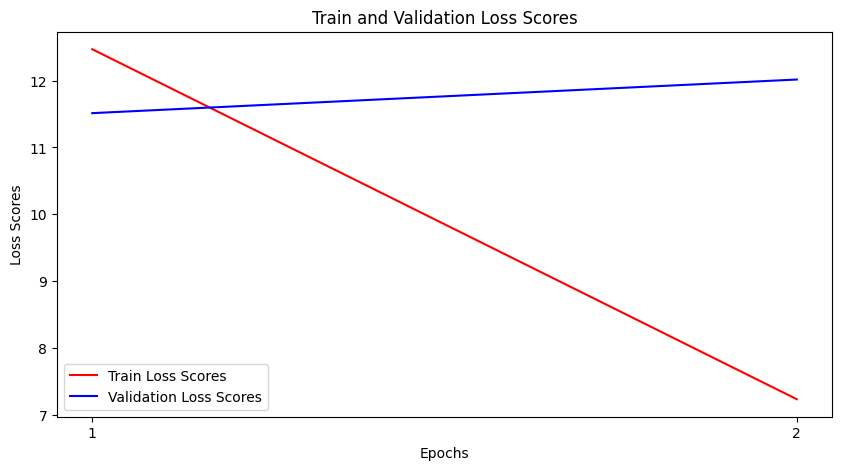

<Figure size 640x480 with 0 Axes>

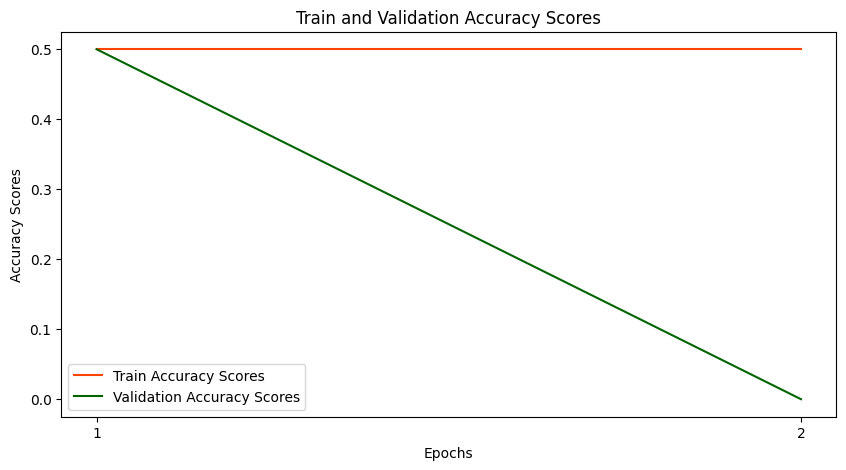

<Figure size 640x480 with 0 Axes>

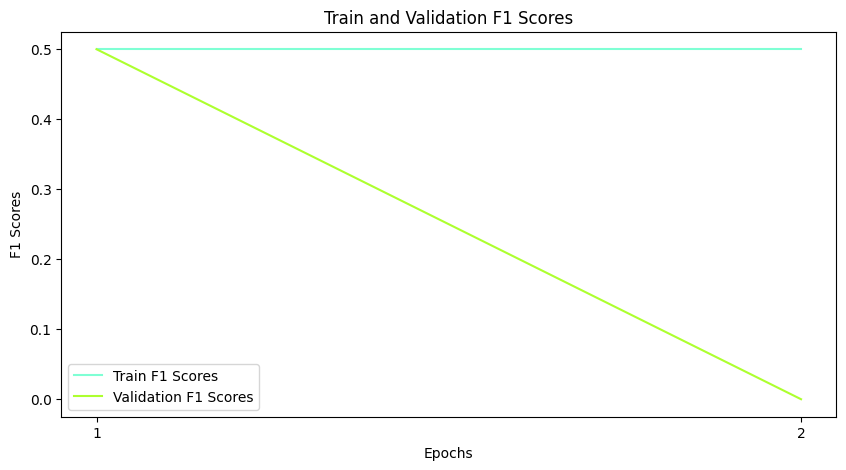

<Figure size 640x480 with 0 Axes>

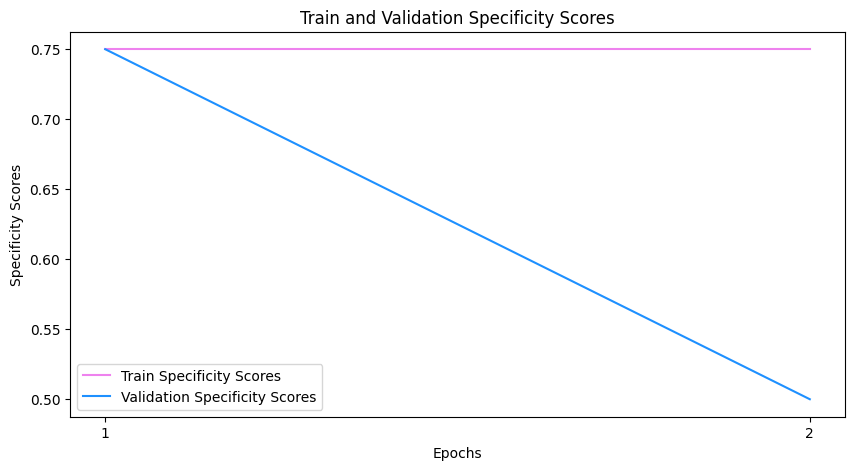

<Figure size 640x480 with 0 Axes>

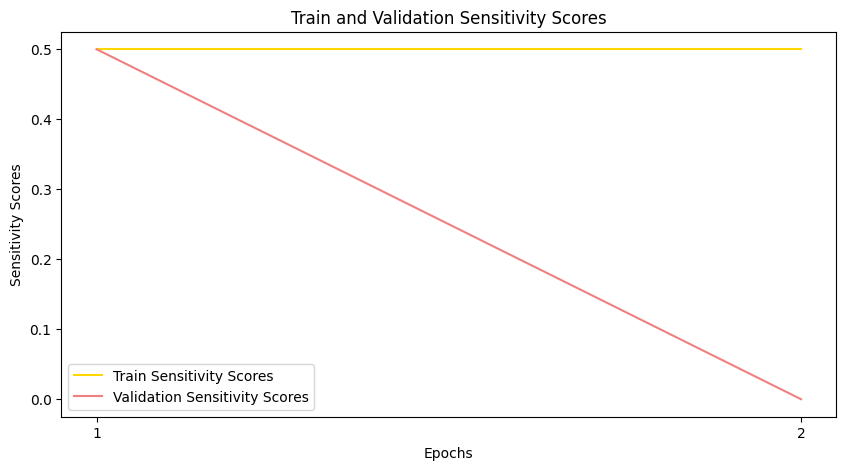

<Figure size 640x480 with 0 Axes>

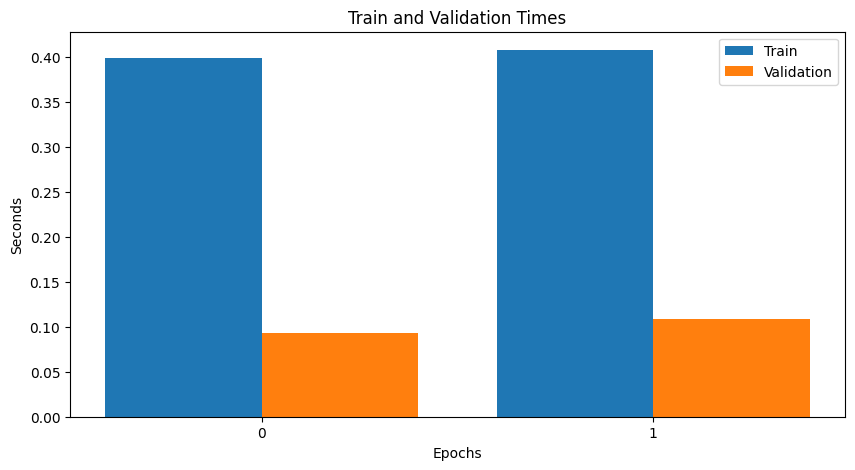

Learning curves can be found in stats

Train times can be found in stats directory under the name times.png



<Figure size 640x480 with 0 Axes>

In [86]:
from matplotlib import pyplot as plt
import numpy as np

class TrainProcessSummary:

    def __init__(self, tr_losses, val_losses, tr_accs, val_accs, tr_f1s,
                 val_f1s, tr_specs, val_spec, tr_sens, val_sens, tr_times,
                 vl_times, data_name, save_path = "stats"):
        
        self.makedirs(save_path)
        self.xlbl, self.times_sv_name   = "Epochs", "times.png"
        self.data_name, self.save_path  = data_name, save_path
        self.tr_losses, self.val_losses = tr_losses, val_losses
        self.tr_accs,   self.val_accs   = tr_accs, val_accs
        self.tr_f1s,    self.val_f1s    = tr_f1s, val_f1s
        self.tr_specs,  self.val_spec   = tr_specs, val_spec
        self.tr_sens,   self.val_sens   = tr_sens, val_sens
        self.tr_times,  self.vl_times   = tr_times, vl_times
        self.get_ticks_labels(); self.learning_curves(); self.bar_plot()

        print(f"Learning curves can be found in {self.save_path}\n")
        print(f"Train times can be found in {self.save_path} directory under the name {self.times_sv_name}\n")
    
    def get_ticks_labels(self): self.xtics, self.xlabels = np.arange(len(self.tr_losses)), [i for i in range(1, len(self.tr_losses) + 1)]

    def makedirs(self, path):   os.makedirs(path, exist_ok = True)
        
    def create_figure(self):    plt.figure(figsize = (10, 5))

    def move2cpu(self, data):   return [d.cpu() for d in data]

    def plot(self, data1, data2, plot_name, c1, c2):
        
        self.create_figure()
        need2bemoved = ["Sensitivity", "Specificity", "F1"]
        if plot_name in need2bemoved: data1 = self.move2cpu(data1); data2 = self.move2cpu(data2) 
        label = f"{plot_name} Scores"
        plt.plot(data1, label = f"Train {label}", color = c1); plt.plot(data2, label = f"Validation {label}", color = c2)
        plt.xlabel(self.xlbl); plt.ylabel(label); plt.title(f"Train and Validation {label}")
        plt.xticks(ticks = self.xtics, labels = self.xlabels); plt.legend(); plt.show()

    def save(self, save_name):

        sv_name = f"{self.data_name}_{save_name}"
        plt.savefig(f"{self.save_path}/{sv_name}")
        
    def learning_curves(self):
        
        self.plot(self.tr_losses, self.val_losses, "Loss",        "red",        "blue");         self.save("losses.png")
        self.plot(self.tr_accs,   self.val_accs,   "Accuracy",     "orangered",  "darkgreen");   self.save("accs.png")
        self.plot(self.tr_f1s,    self.val_f1s,    "F1",          "aquamarine", "greenyellow");  self.save("f1s.png")
        self.plot(self.tr_specs,  self.val_spec,   "Specificity", "violet",     "dodgerblue");   self.save("specs.png")        
        self.plot(self.tr_sens,   self.val_sens,   "Sensitivity", "gold",       "lightcoral");   self.save("sens.png")
        
    def bar_plot(self):
        
        self.create_figure();               
        
        plt.bar(self.xtics - 0.2, self.tr_times, 0.4, label = "Train") 
        plt.bar(self.xtics + 0.2, self.vl_times, 0.4, label = "Validation") 
        
        plt.xticks(self.xtics);   plt.xlabel(self.xlbl) 
        plt.ylabel("Seconds");    plt.title("Train and Validation Times") 
        plt.legend(); plt.show(); self.save(self.times_sv_name)

TrainProcessSummary(*results, data_name = data_name)